# Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture
!pip install ekorpkit[art]
exit()
```

## Prepare Environment

In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime
%load_ext autoreload
%autoreload 2 # reload modules before executing user code, set to 0 to disable

from ekorpkit import eKonf

eKonf.setLogger("WARNING")
eKonf.set_cuda(device=4)
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
eKonf.set_workspace(workspace="/content/drive/MyDrive/workspace/", project="ekorpkit-book")

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:4)']
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace/
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev4
is notebook? True
is colab? False


('/content/drive/MyDrive/workspace', 'ekorpkit-book')

time: 5.18 s (started: 2022-11-03 00:58:17 +00:00)


## Create a stable diffusion instance

In [2]:
from ekorpkit.models.art.stable import StableDiffusion

# cfg = eKonf.compose("model/stable_diffusion")
# sd = eKonf.instantiate(cfg)
sd = StableDiffusion()

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

time: 57.3 s (started: 2022-11-03 00:58:22 +00:00)


## Generate images

In [3]:
text_prompts = "a living tiger inside a gorgeous cave in a futuristic Jeju island, relaxing night, watercolour on the ceiling, glowing on glass, light art, dark, dark, gorgeous, dark, bright in an abandoned village in a futuristic alien nightscape"
batch_name = "cave-jeju"

time: 596 µs (started: 2022-11-03 00:59:19 +00:00)


INFO:ekorpkit.batch:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen
INFO:ekorpkit.batch:Batch name: cave-jeju, Batch num: 6
INFO:ekorpkit.batch:Merging config with args: {}
INFO:ekorpkit.batch:Setting seed to 899200523
INFO:ekorpkit.models.art.base:Prompt: a living tiger inside a gorgeous cave in a futuristic Jeju island, relaxing night, watercolour on the ceiling, glowing on glass, light art, dark, dark, gorgeous, dark, bright in an abandoned village in a futuristic alien nightscape


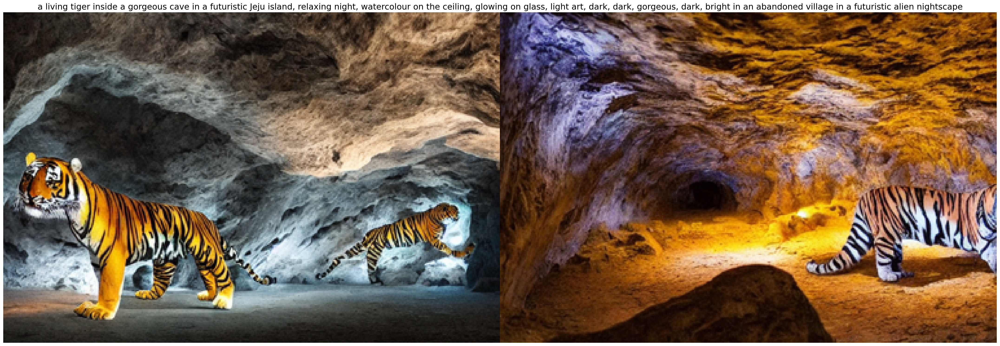

INFO:ekorpkit.batch:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/stable-diffusion/stable-batch/cave-jeju(6)_config.yaml


time: 30.2 s (started: 2022-11-03 00:52:51 +00:00)


In [4]:
eKonf.setLogger("INFO")
sd.verbose = True

results = sd.imagine(
    text_prompts, 
    batch_name=batch_name, 
    num_samples=2, 
    show_collage=True,
    guidance_scale=7
)

## Inpaint images

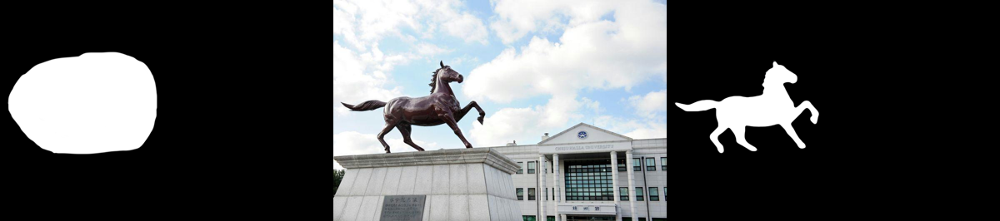

time: 2.6 s (started: 2022-11-03 00:53:21 +00:00)


In [5]:
base_url = "https://github.com/entelecheia/ekorpkit-book/raw/main/assets/figs"
init_image_path = f"{base_url}/chu-horse.png"
mask_image_path = f"{base_url}/chu-horse-masking-rough.png"
mask_image_exact_path = f"{base_url}/chu-horse-masking-exact.png"

init_image = eKonf.load_image(init_image_path)
mask_image = eKonf.load_image(mask_image_path)
mask_image_exact = eKonf.load_image(mask_image_exact_path)

sd.compare_images([mask_image, init_image, mask_image_exact], resize_ratio=0.5)

INFO:ekorpkit.batch:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen
INFO:ekorpkit.batch:Batch name: cave-jeju, Batch num: 7
INFO:ekorpkit.batch:Merging config with args: {}
INFO:ekorpkit.batch:Setting seed to 3805166111
INFO:ekorpkit.models.art.base:Prompt: a golden statue of an eagle with clouds, colorful painting by Tanya Hern, mural on the roof, digital art, artwork, beautiful, colorful, visual art on landscape, surrealism, watercolor, vivid by stunning


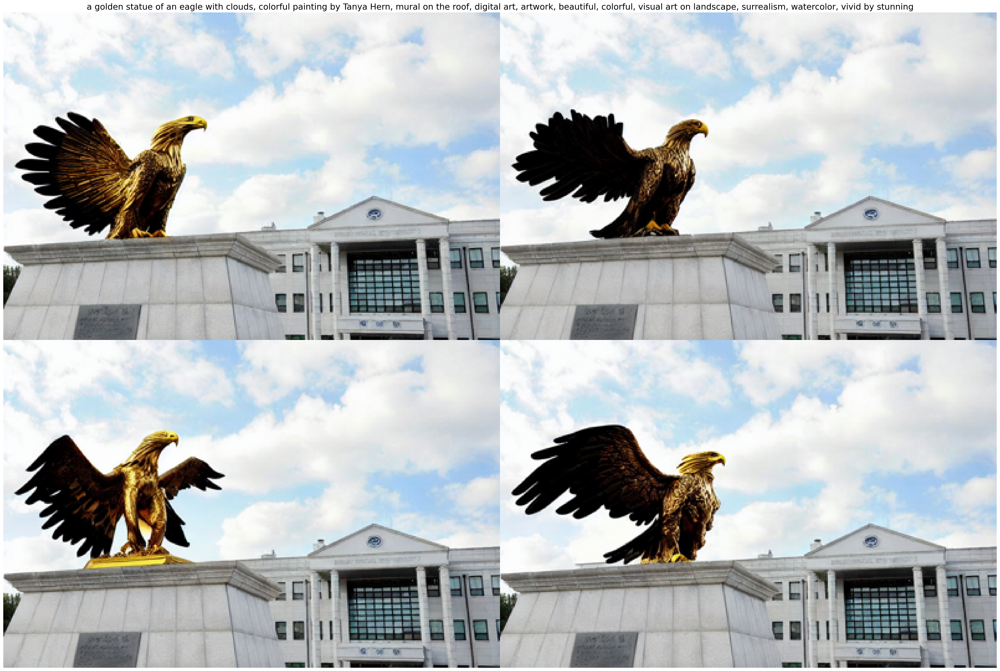

INFO:ekorpkit.batch:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/outputs/stable-diffusion/stable-batch/cave-jeju(7)_config.yaml


time: 54 s (started: 2022-11-03 00:53:24 +00:00)


In [6]:
prompt = "a golden statue of an eagle with clouds, colorful painting by Tanya Hern, mural on the roof, digital art, artwork, beautiful, colorful, visual art on landscape, surrealism, watercolor, vivid by stunning"

results = sd.imagine(
    prompt, 
    mode="inpaint",
    init_image=init_image_path,
    mask_image=mask_image_path,
    num_samples=2,
    num_images_per_prompt=2, 
    inpaint_strength=10, 
    num_inference_steps=100,
    return_including_init_image=False
)

## Stitch images

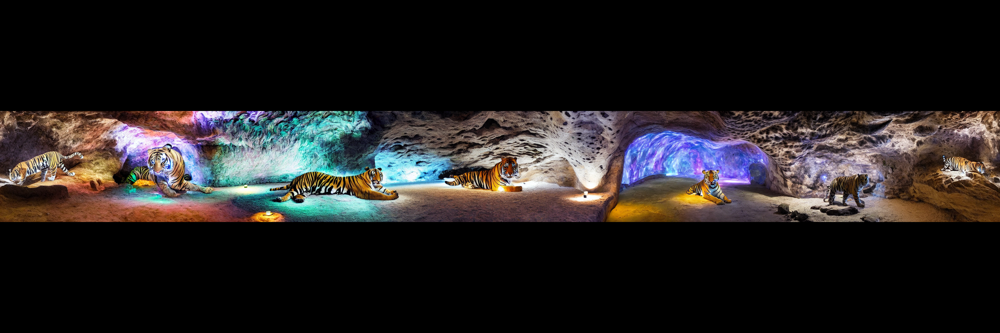

time: 2min (started: 2022-11-03 01:03:19 +00:00)


In [6]:
results = sd.imagine(
    text_prompts, 
    mode="stitch",
    batch_name=batch_name, 
    num_samples=6, 
    guidance_scale=7,
    inpaint_strength=10, 
    show_collage=True,
)

To view the panorama, upload the image to [renderstuff](https://renderstuff.com/tools/360-panorama-web-viewer/).

## Show Configuration

In [5]:
sd.show_config(batch_name=batch_name, batch_num=0)

{'_target_': 'ekorpkit.models.art.stable.StableDiffusion',
 'autoload': True,
 'batch_name': 'cave-jeju',
 'batch_num': 0,
 'device': 'cuda:7',
 'hf_user_access_token': None,
 'imagine': {'guidance_scale': 2,
             'height': 512,
             'init_image': None,
             'inpaint_strength': 0.75,
             'mask_image': None,
             'mode': 'generate',
             'num_images_per_prompt': 1,
             'num_inference_steps': 100,
             'num_samples': 2,
             'text_prompts': {0: ['a living tiger inside a gorgeous cave in a '
                                  'futuristic Jeju island, relaxing night, '
                                  'watercolour on the ceiling, glowing on '
                                  'glass, light art, dark, dark, gorgeous, '
                                  'dark, bright in an abandoned village in a '
                                  'futuristic alien nightscape']},
             'width': 768},
 'model': {'generate': {'dev